### Characterizing bursting dynamics of links

In order to charaterize the bursting dynamics of the links in the temporal network (see Notebook 4) the methods in __GDa.stats.bursting__ module can be used. 

In particular, we do so for binary arrays of activations that, similar to  spike-trains, are binary with the value one used to represent the activation of a certain link. For each activation sequence we characterize the following statistics: link avg. activation time (mu), total act. time relative to task stage time (mu_tot), CV (mean activation time over its std).

This procedure requires that we threshold the values of coherence in the temporal network. The thresholds are defined for each link (relative) or commonly for all links (absolute) based on a arbritary quartile of the coherence distribution __q__. Since this thresholding procedure can affect the results we also study how the threshold level influnces the statistics measured. It is also important to note that since we may compare different trial types (ODRT, int. fixation, blocked fixation) the threshold is computed commonly for all the trials.

Analysis of the burst dynamics of each link for each frequency band and stage of the ODRT.

- Recompute supertensor with novel and better multi-taper approach and bands of reference without leakage (then show a plot of how a piece of this supertensor looks like)
- Plot the "ERP don't exist" figures as in the slide here below 
- Plot a binarized raster for a threshold of reference, common between task and fixation trials
- Extracts link activation events (measured in ms) taking care of not crossing trial boundaries prior to concatenating all trials together
- Compute concatenated trial distributions of: i) link activation time (in ms); ii) total activation time (relative to total time in task stage across all trials); and, iii) CV for the reference threshold
- Track how the peaks (e.g. median) and widths (e.g. interquartile range) of these distributions vary as a function of changing threshold
- Compute joint distribution of pairs formed of the quantities i-iii above plus also link length (measured along white matter tract if possible)
- Plot the baseline surface of these distributions and the relative variation with baseline for the other task stages
- Plot the variations between fixation and task trials joint distributions above
- Compute meta-connectivity...
- Plot how modularity and average of MC change as a function of threshold
- Compute multiplex meta-connectivity as well, where sync is between a link in one layer and a link in another layer, not just within layer

In [2]:
# Adding GDa to path
import sys
sys.path.insert(1, '/home/vinicius/GrayData-Analysis')
# Importing the temporal network class
from   GDa.temporal_network              import temporal_network
from   GDa.spectral_analysis             import filtering, \
                                                time_frequency
from   GDa.net.util                      import compute_coherence_thresholds
from   tqdm                              import tqdm
from   joblib                            import Parallel, delayed
from   GDa.graphics.plot_brain_sketch    import *
from   GDa.misc.create_grids             import create_stages_time_grid
from   GDa.session                       import session
from   sklearn.manifold                  import TSNE
from   scipy                             import stats
import GDa.stats.bursting       as       bst
import seaborn                  as       sns
import numpy                    as       np
import xarray                   as       xr
import matplotlib.pyplot        as       plt
import scipy.signal
import time
import os
import h5py

In [3]:
# Auxiliary function to smooth
def smooth(x, w):
    return scipy.signal.fftconvolve(x, np.ones(w)/w, mode='same')

# Bands names
band_names  = [r'band 1', r'band 2', r'band 3', r'band 4', r'band 5']
stages      = ['baseline', 'cue', 'delay', 'match']

### Loading session

In [4]:
# Parameters to read the data
idx      = 3 
nses     = 1
nmonkey  = 0
align_to = 'cue'

dirs = { 'rawdata':'/home/vinicius/GrayData-Analysis/GrayLab/',
         'results':'Results/',
         'monkey' :['lucy', 'ethyl'],
         'session':'session01',
         'date'   :[['141014', '141015', '141205', '150128', '150211', '150304'], []] }

In [5]:
#  Instantiating session
ses   = session(raw_path = dirs['rawdata'], monkey = dirs['monkey'][nmonkey], date = dirs['date'][nmonkey][idx],
                session = nses, slvr_msmod = False, align_to = align_to, evt_dt = [-0.65, 3.00])
# Load data
ses.read_from_mat()

### Coherence computation

In [6]:
# Parameters for coherence computation
bands          = [[0.1,6],[6,14],[14,26],[26,42],[42,80]]
freqs          = np.mean( bands, axis = 1)
d_f            = np.ceil( (np.array(bands)[:,1]-np.array(bands)[:,0])/2 )
time_bandwidth = 8.0
n_cycles       = time_bandwidth * freqs / d_f
delta          = 15 
d_t            = delta/ses.data.attrs['fsample']
kernel         = 'square'
win_time       = 0.5 # S
win_freq       = 1
method         = 'multitaper'

In [7]:
'''coh = time_frequency.wavelet_coherence(data = ses.data, pairs = ses.data.attrs['pairs'], 
      fs = ses.data.attrs['fsample'], freqs = freqs, n_cycles = n_cycles, 
      time_bandwidth = time_bandwidth, delta = delta, method = method, 
      win_time = win_time, win_freq = win_freq, kernel=kernel,
      dir_out = None, n_jobs = -1)'''

"coh = time_frequency.wavelet_coherence(data = ses.data, pairs = ses.data.attrs['pairs'], \n      fs = ses.data.attrs['fsample'], freqs = freqs, n_cycles = n_cycles, \n      time_bandwidth = time_bandwidth, delta = delta, method = method, \n      win_time = win_time, win_freq = win_freq, kernel=kernel,\n      dir_out = None, n_jobs = -1)"

In [8]:
'''path_st = os.path.join('data', 
                       dirs['monkey'][nmonkey] + '_session01_' + dirs['date'][nmonkey][idx]+ '.h5')

hf = h5py.File(path_st, 'w')
hf.create_dataset('coherence', data=coh)
hf.create_dataset('freqs',     data=freqs)
hf.create_dataset('tarray',    data=ses.time[::delta])
hf.create_dataset('bands',     data=bands)
[hf.create_dataset('info/'+k,  data=ses.data.attrs[k]) for k in ses.data.attrs.keys()]
hf.close()

del coh'''

"path_st = os.path.join('data', \n                       dirs['monkey'][nmonkey] + '_session01_' + dirs['date'][nmonkey][idx]+ '.h5')\n\nhf = h5py.File(path_st, 'w')\nhf.create_dataset('coherence', data=coh)\nhf.create_dataset('freqs',     data=freqs)\nhf.create_dataset('tarray',    data=ses.time[::delta])\nhf.create_dataset('bands',     data=bands)\n[hf.create_dataset('info/'+k,  data=ses.data.attrs[k]) for k in ses.data.attrs.keys()]\nhf.close()\n\ndel coh"

When instantiated, the temporal network object will load the recording info for the monkey, date, and session specified as well as the super tensor;

The super-tensor has dimensions [Number of pairs, Number of frequency bands, Number of trials, Time]. For Lucy the frequency bands analysed are:

- band $1$  = [0.1,6]  Hz;
- band $2$  = [6,14]   Hz;
- band $3$  = [14,26]  Hz;
- band $4$  = [26,42]  Hz;
- band $5$  = [42,80]  Hz;

The __temporal_network__ class can also be instantiated by setting threshold as __True__ this will automatically threshold the super-tensor.

### Distribution of the average coherence value per task-stage and band


In [9]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(data_raw_path='../GrayLab/', 
           tensor_raw_path='data/', monkey=dirs['monkey'][nmonkey], 
           session=1, date=dirs['date'][nmonkey][idx], trial_type=[1],
           behavioral_response=[1], trim_borders=True, wt=(20,30), 
           threshold=False)

In [10]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 540, time: 194)>
array([[[[9.45216309e-01, 9.40041972e-01, 9.32518981e-01, ...,
          5.46061298e-01, 5.69186303e-01, 5.94681016e-01],
         [9.02857074e-01, 9.11276221e-01, 9.19244313e-01, ...,
          4.89350219e-01, 4.72082292e-01, 4.53640580e-01],
         [4.48691125e-01, 4.41851895e-01, 4.35180660e-01, ...,
          3.27370209e-01, 3.53776208e-01, 3.81016238e-01],
         ...,
         [7.76389335e-01, 7.84320713e-01, 7.92112149e-01, ...,
          6.55292969e-01, 6.41806436e-01, 6.34590661e-01],
         [8.12506896e-01, 7.87088406e-01, 7.60137452e-01, ...,
          3.44675663e-01, 3.47031067e-01, 3.55551858e-01],
         [7.69791792e-01, 7.85151140e-01, 7.94152659e-01, ...,
          8.14293926e-01, 8.08883314e-01, 8.02909184e-01]],

        [[6.00076156e-01, 5.95309700e-01, 5.92705969e-01, ...,
          5.56505236e-01, 5.59900703e-01, 5.68462236e-01],
         [8.99616517e-01, 8.66446308e-01, 8.25891751e-01, ...,
          8.18347730e-01, 8.31495783e-01, 8.42258504e-01],
         [1.20747537e-01, 1.59492257e-01, 2.02780794e-01, ...,
          6.48025208e-01, 6.32146394e-01, 6.06257617e-01],
         ...,
         [8.11032358e-01, 7.59106397e-01, 6.94062032e-01, ...,
          7.85638966e-01, 7.93942724e-01, 8.00927850e-01],
         [9.26368519e-01, 9.40349218e-01, 9.52577111e-01, ...,
          9.21396805e-01, 9.12566675e-01, 9.03899334e-01],
         [7.20844586e-01, 7.22535023e-01, 7.19996773e-01, ...,
          6.97825163e-01, 6.74728911e-01, 6.49906874e-01]],

        [[3.47047636e-01, 3.73553754e-01, 3.96618544e-01, ...,
          3.17670063e-01, 3.76456004e-01, 4.34374024e-01],
         [6.14134015e-01, 6.13398078e-01, 6.17850948e-01, ...,
          7.70890496e-01, 7.61211699e-01, 7.50154550e-01],
         [5.32331225e-01, 5.45323761e-01, 5.55068023e-01, ...,
          5.71029201e-01, 5.45407239e-01, 5.19806106e-01],
         ...,
         [6.65923968e-01, 6.66076929e-01, 6.61042919e-01, ...,
          8.43527690e-01, 8.55609643e-01, 8.58338509e-01],
         [1.36018631e-01, 1.53105833e-01, 1.68516696e-01, ...,
          6.35357087e-01, 6.17004468e-01, 6.01807276e-01],
         [1.33507120e-01, 1.66662983e-01, 2.04636687e-01, ...,
          4.52372406e-01, 4.62243580e-01, 4.82687386e-01]],

        [[7.33187728e-01, 7.34149808e-01, 7.35007679e-01, ...,
          1.79698918e-01, 2.48393952e-01, 3.32562660e-01],
         [2.20925674e-01, 2.35489782e-01, 2.52472703e-01, ...,
          1.23823560e-02, 1.69236009e-02, 2.63074246e-02],
         [3.66312056e-01, 3.34641173e-01, 2.98653182e-01, ...,
          6.60404417e-01, 6.19694689e-01, 5.80015800e-01],
         ...,
         [7.73138147e-02, 3.91807043e-02, 1.79085680e-02, ...,
          8.02346728e-02, 8.98843965e-02, 1.06297016e-01],
         [1.37746906e-01, 1.51235179e-01, 1.72832541e-01, ...,
          7.93303660e-01, 7.96791171e-01, 7.97771805e-01],
         [5.55018357e-01, 5.81618696e-01, 6.11415881e-01, ...,
          7.69613728e-01, 7.75442936e-01, 7.74417232e-01]],

        [[2.19248010e-01, 2.13841862e-01, 2.04019497e-01, ...,
          2.93994919e-01, 2.84626420e-01, 2.86205527e-01],
         [2.95271607e-01, 2.45563941e-01, 2.22464010e-01, ...,
          9.42175254e-03, 6.81491508e-03, 4.64411026e-03],
         [1.64552475e-01, 1.95017497e-01, 2.44749815e-01, ...,
          6.97849120e-01, 6.91248765e-01, 6.67740479e-01],
         ...,
         [1.67590520e-01, 2.33719409e-01, 2.71504491e-01, ...,
          2.15727747e-01, 2.03972261e-01, 1.80020080e-01],
         [1.96922913e-01, 2.01805893e-01, 2.08162291e-01, ...,
          2.10336991e-01, 2.15241220e-01, 2.26209653e-01],
         [2.97887220e-01, 2.96037149e-01, 2.92378563e-01, ...,
          2.38791916e-01, 2.23695693e-01, 1.79909487e-01]]],


       [[[8.82824177e-01, 8.60341950e-01, 8.35112295e-01, ...,
          1.26300689e-01, 1.47820109e-01, 1.67514229e-01],
         [9.44728680e-01, 9.38261674e-01, 9.29888117e-01, ...,
      

In [13]:
net.get_data_from(stage=stages[0])

<xarray.DataArray (links: 1176, bands: 5, observations: 12960)>
array([[[0.94521631, 0.94004197, 0.93251898, ..., 0.05037386,
         0.07924552, 0.12138599],
        [0.60007616, 0.5953097 , 0.59270597, ..., 0.75148984,
         0.77393888, 0.79526028],
        [0.34704764, 0.37355375, 0.39661854, ..., 0.12261928,
         0.11869689, 0.11461536],
        [0.73318773, 0.73414981, 0.73500768, ..., 0.5493746 ,
         0.50650396, 0.4504868 ],
        [0.21924801, 0.21384186, 0.2040195 , ..., 0.24651652,
         0.22013163, 0.20520453]],

       [[0.88282418, 0.86034195, 0.8351123 , ..., 0.25594171,
         0.19371658, 0.14078129],
        [0.71786199, 0.74483671, 0.77599014, ..., 0.92030301,
         0.90415361, 0.88601113],
        [0.3268119 , 0.29283464, 0.26291638, ..., 0.01222283,
         0.02125941, 0.03079939],
        [0.19936421, 0.18142402, 0.17586425, ..., 0.5913252 ,
         0.60370608, 0.62413891],
        [0.13860469, 0.16540447, 0.18860059, ..., 0.26176512,
         0.24472224, 0.24512987]],

       [[0.92041365, 0.91413735, 0.90775399, ..., 0.5985076 ,
         0.59325813, 0.5906588 ],
        [0.82739476, 0.8182738 , 0.81128585, ..., 0.63039678,
         0.64237836, 0.65559722],
        [0.54364577, 0.5381762 , 0.52815471, ..., 0.26067123,
         0.27817573, 0.2886237 ],
        [0.44372489, 0.42380556, 0.40328272, ..., 0.3540218 ,
         0.34076953, 0.32514748],
        [0.17265962, 0.15467304, 0.14637086, ..., 0.1300482 ,
         0.11747929, 0.09921391]],

       ...,

       [[0.75786768, 0.7191435 , 0.67938006, ..., 0.58935997,
         0.58478152, 0.58132957],
        [0.33123979, 0.3816519 , 0.43238344, ..., 0.55821498,
         0.54744994, 0.53736937],
        [0.72996565, 0.72149243, 0.70940407, ..., 0.01027095,
         0.01482394, 0.01817732],
        [0.42358075, 0.4277141 , 0.42910615, ..., 0.35999794,
         0.35534786, 0.31595371],
        [0.16617317, 0.18951844, 0.20130601, ..., 0.37486802,
         0.40733575, 0.43873116]],

       [[0.36664701, 0.37566272, 0.384028  , ..., 0.94795104,
         0.94675885, 0.94479872],
        [0.65358265, 0.70676442, 0.7471277 , ..., 0.79894486,
         0.79312402, 0.78960465],
        [0.66281527, 0.65725047, 0.63650939, ..., 0.51876279,
         0.52528382, 0.53201683],
        [0.43521813, 0.44033723, 0.43705561, ..., 0.00340305,
         0.00764701, 0.00924921],
        [0.1560491 , 0.13709165, 0.10622099, ..., 0.50339213,
         0.54094823, 0.57579606]],

       [[0.54503035, 0.53765725, 0.53038613, ..., 0.93045697,
         0.9333488 , 0.93495581],
        [0.5691055 , 0.61092302, 0.65185897, ..., 0.7290145 ,
         0.72032659, 0.71542318],
        [0.76147341, 0.75027937, 0.74551388, ..., 0.39106875,
         0.40295676, 0.40998928],
        [0.21938698, 0.24882228, 0.28169448, ..., 0.12004188,
         0.12474219, 0.12393417],
        [0.14257761, 0.14420084, 0.16043273, ..., 0.50379805,
         0.49005779, 0.46923571]]])
Coordinates:
  * observations  (observations) MultiIndex
  - trials        (observations) int64 1 1 1 1 1 1 1 ... 886 886 886 886 886 886
  - time          (observations) float64 -0.35 -0.335 -0.32 ... -0.02 -0.005
Dimensions without coordinates: links, bands
Attributes:
    nT:               750
    areas:            [b'a46V' b'a24c' b'a46D' b'F7' b'a9/46D' b'a8M' b'a8r' ...
    channels_labels:  [  1   4   9  13  16  17  22  23  26  27  29  34  39  4...
    fsample:          1000.0
    indch:            [ 0  1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 17 18 ...
    nC:               49
    nP:               1176
    pairs:            [[ 0  1]\n [ 0  2]\n [ 1  2]\n ...\n [45 48]\n [46 48]\...
    stim:             [nan  2.  5.  2.  4.  2.  4.  2.  5.  1.  3.  5.  5.  1...
    t_cue_off:        [1495. 1371. 1600. 1528. 1480. 1489. 1473. 1341. 1553. ...
    t_cue_on:         [ 975.  851. 1093. 1021.  973.  969.  966.  835. 1046. ...
    t_match_on:       [2654. 2824. 2946. 2954. 2759. 2676. 2699. 2474. 2846. ...

In [ ]:
for i in tqdm( range(bands) ):
    for j in range( len(stages) ):
        aux = net.get_data_from(stage=stages[j])

### Analysis for default threshold parameter

In the cells bellow we perform the burstness analysis for the default thresholding parameter.

In [8]:
# Default threshold
q_thr = 0.8

In [9]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(data_raw_path='../GrayLab/', 
           tensor_raw_path='data/', monkey=dirs['monkey'][nmonkey], 
           session=1, date=dirs['date'][nmonkey][idx], trial_type=[1],
           behavioral_response=[1], trim_borders=True, wt=(20,30), 
           threshold=True, relative=True, q=q_thr)

Computing coherence thresholds


100%|██████████| 5/5 [00:55<00:00, 11.07s/it]


In [10]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 540, time: 194)>
array([[[[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [ True,  True, False, ..., False, False,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False,  True, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, 

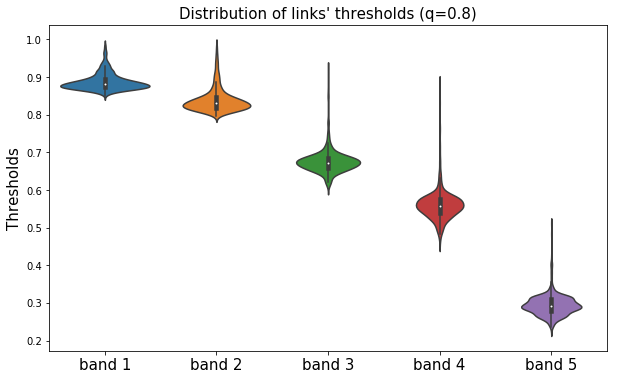

In [11]:
plt.figure(figsize=(10,6))
sns.violinplot(data=net.coh_thr)
plt.title('Distribution of links\' thresholds (q=0.8)', fontsize=15);
plt.xticks(range(len(bands)), band_names, fontsize=15);
plt.ylabel('Thresholds', fontsize=15);

To use the Python package igraph to compute network theory quantities it is necessary to instantiate a __Graph__ object, to do so we have to provide an adjacency matrix to the __Graph__ method. Note that the super tensor is the edge representation of the network, but we can convert it to an adjacency matrix by calling the methdo __convert_to_adjacency__ in the class __temporal_network__. This method will create the variable __A__ inside the object.

In [12]:
net.convert_to_adjacency()

#### X, Y coordinates of each node

In [13]:
xy   = scipy.io.loadmat('../Brain Areas/lucy_brainsketch_xy.mat')['xy'] # Channels coordinates
d_eu = np.zeros(net.session_info['pairs'].shape[0])
for i in range(net.session_info['pairs'].shape[0]):
    c1, c2 = net.session_info['channels_labels'].astype(int)[net.session_info['pairs'][i,0]], net.session_info['channels_labels'].astype(int)[net.session_info['pairs'][i,1]]
    dx = xy[c1-1,0] - xy[c2-1,0]
    dy = xy[c1-1,1] - xy[c2-1,1]
    d_eu[i] = np.sqrt(dx**2 + dy**2)

#### Mask to track observations within a task-stage

Since tha analysis is performed for each period of the experiment o have to crate masks to acess values for a specific period (baseline, cue, delay or match)

In [19]:
net.create_stage_masks(flatten=True)

In [16]:
540*194

104760

In [17]:
net.get_data_from(stage='baseline',pad=False)

IndexError: Boolean array size 540 is used to index array with shape (104760,).

#### Visualizing the super tensor

Now let's take a look on the binary super-tensor by plotting its first 10 trials.

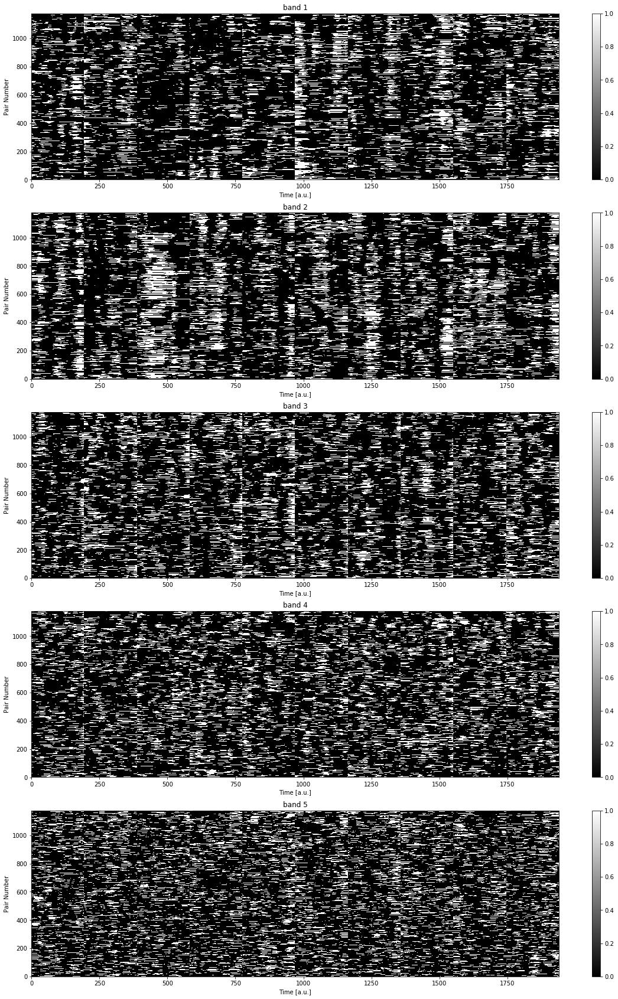

In [14]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].stack(observations=('trials','time')), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(band_names[i])

We can also check the super-tensor averaged over trials, which gives an idea of the probability of a certain link being active at a certain moment of the trial.

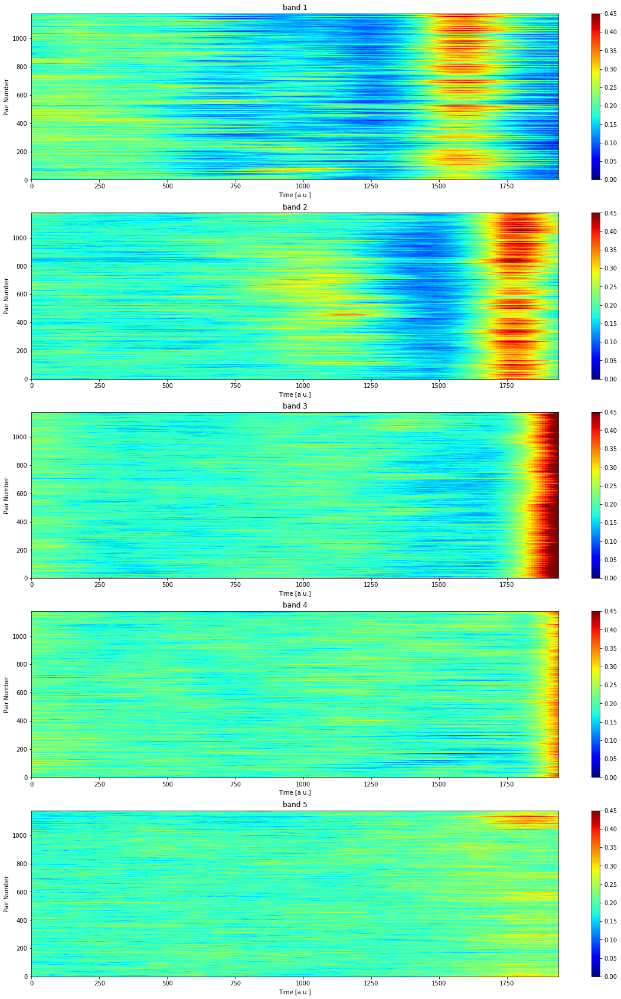

In [15]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:,:].mean(dim='trials'), 
               aspect = 'auto', cmap = 'jet', origin = 'lower', vmin=0, vmax=.45, 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']])
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(band_names[i])

#### Trial-by-trial variability and ERP

Here we show the link-averaged time-series of activations for each trials, its median and 5% and 95% quartiles.

Text(0.5, 0, 'Time [s]')

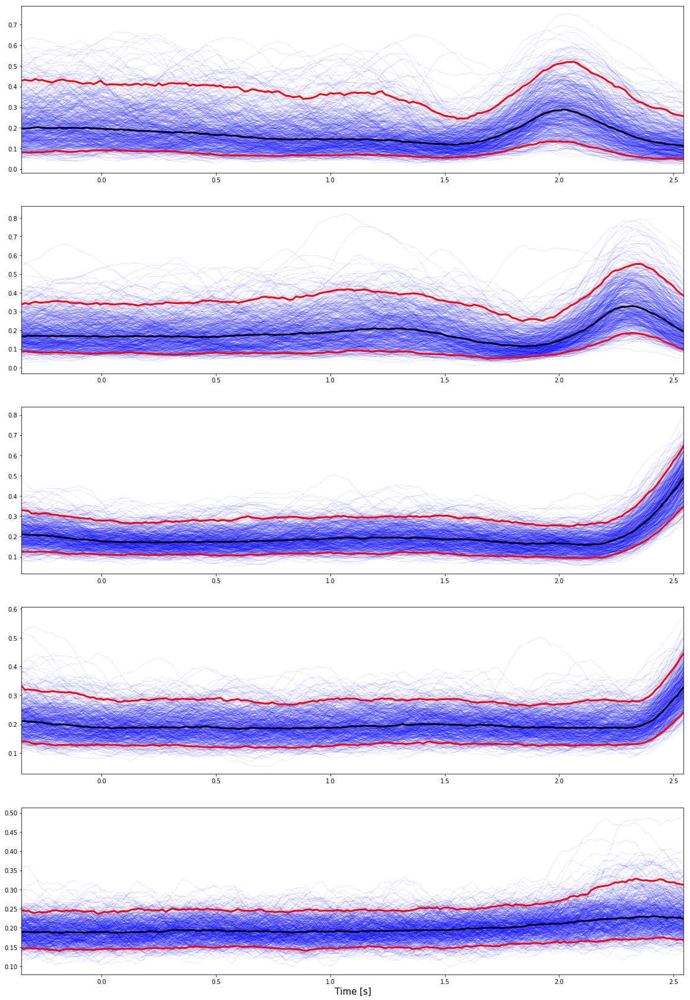

In [16]:
plt.figure(figsize=(20,30))
# Average activation sequences over links
mu_filtered_super_tensor = net.super_tensor.mean(dim='links')
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    for t in range(net.super_tensor.shape[2]):
        plt.plot(net.tarray, 
        mu_filtered_super_tensor.isel(trials=t, bands=i).values, 
        color='b', lw=.1)
    plt.plot(net.tarray, 
             mu_filtered_super_tensor.isel(bands=i).median(dim='trials'),
            color='k', lw=3)
    plt.plot(net.tarray, 
         mu_filtered_super_tensor.isel(bands=i).quantile(q=5/100,dim='trials'),
        color='r', lw=3)
    plt.plot(net.tarray, 
     mu_filtered_super_tensor.isel(bands=i).quantile(q=95/100,dim='trials'),
    color='r', lw=3)
    plt.xlim([net.tarray[0],net.tarray[-1]])
plt.xlabel('Time [s]', fontsize=15)

We can also project each trial time series in the 2D space using T-SNE to better visualize how the trials are distributed. For this let's use 50 trials.

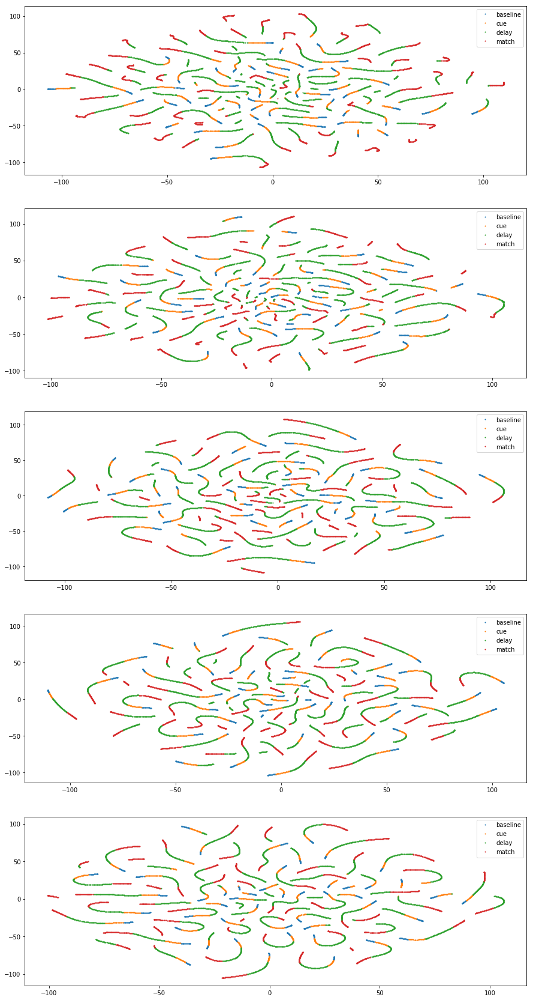

In [20]:
plt.figure(figsize=(15,30))
for j in range(len(bands)):
    aux = net.super_tensor.isel(bands=j, trials=slice(0,50))
    aux = aux.stack(observations=("trials","time"))
    Y = TSNE(n_components=2, 
             metric='hamming', 
             perplexity=30.0,
             square_distances=True,
             n_jobs=40).fit_transform(aux.T)
    plt.subplot(len(bands), 1, j+1)
    for i in range(len(stages)):
        plt.plot(Y[net.s_mask[stages[i]][:50*len(net.tarray)],0], 
                 Y[net.s_mask[stages[i]][:50*len(net.tarray)],1], 
                 '.', ms=2, label = stages[i])
        plt.legend()

### CV distribution per band and task stage

In [15]:
STb = net.super_tensor.stack(observations=("trials", "time"))

In [16]:
STb

<xarray.DataArray (links: 1176, bands: 5, observations: 104760)>
array([[[ True,  True,  True, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ..., False, False, False],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ..., False, False, False]],

       [[ True, False, False, ..., False, False, False],
        [ True, False, False, ..., False, False, False],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       ...,

       [[False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [ True,  True,  True, ..., False,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ..., False,  True,  True]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ...,  True,  True,  True],
        [False, False, False, ..., False, False, False],
        [ True, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])
Coordinates:
  * observations  (observations) MultiIndex
  - trials        (observations) int64 1 1 1 1 1 1 1 ... 886 886 886 886 886 886
  - time          (observations) float64 -0.35 -0.335 -0.32 ... 2.515 2.53 2.545
Dimensions without coordinates: links, bands
Attributes:
    nT:               750
    areas:            [b'a46V' b'a24c' b'a46D' b'F7' b'a9/46D' b'a8M' b'a8r' ...
    channels_labels:  [  1   4   9  13  16  17  22  23  26  27  29  34  39  4...
    fsample:          1000.0
    indch:            [ 0  1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 17 18 ...
    nC:               49
    nP:               1176
    pairs:            [[ 0  1]\n [ 0  2]\n [ 1  2]\n ...\n [45 48]\n [46 48]\...
    stim:             [nan  2.  5.  2.  4.  2.  4.  2.  5.  1.  3.  5.  5.  1...
    t_cue_off:        [1495. 1371. 1600. 1528. 1480. 1489. 1473. 1341. 1553. ...
    t_cue_on:         [ 975.  851. 1093. 1021.  973.  969.  966.  835. 1046. ...
    t_match_on:       [2654. 2824. 2946. 2954. 2759. 2676. 2699. 2474. 2846. ...

In [18]:
net.s_mask[stages[j]]

<xarray.DataArray (trials: 540, time: 194)>
array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])
Dimensions without coordinates: trials, time

In [20]:
# Burstiness analysis statistics
bs_stats = np.zeros((STb.sizes['links'],STb.sizes['bands'],len(stages), 3))
for i in tqdm( range(len(net.bands)) ):
    for j in range(len(stages)):
        bs_stats[:,i,j,:]=np.apply_along_axis(bst.compute_burstness_stats, 1, 
                                            STb[:,i,:]*net.s_mask[stages[j]], 
                                            samples = np.sum(net.s_mask[stages[j]]), 
                                            dt=delta/STb.attrs['fsample'])

100%|██████████| 5/5 [00:32<00:00,  6.46s/it]


100%|██████████| 5/5 [00:00<00:00, 33.62it/s]


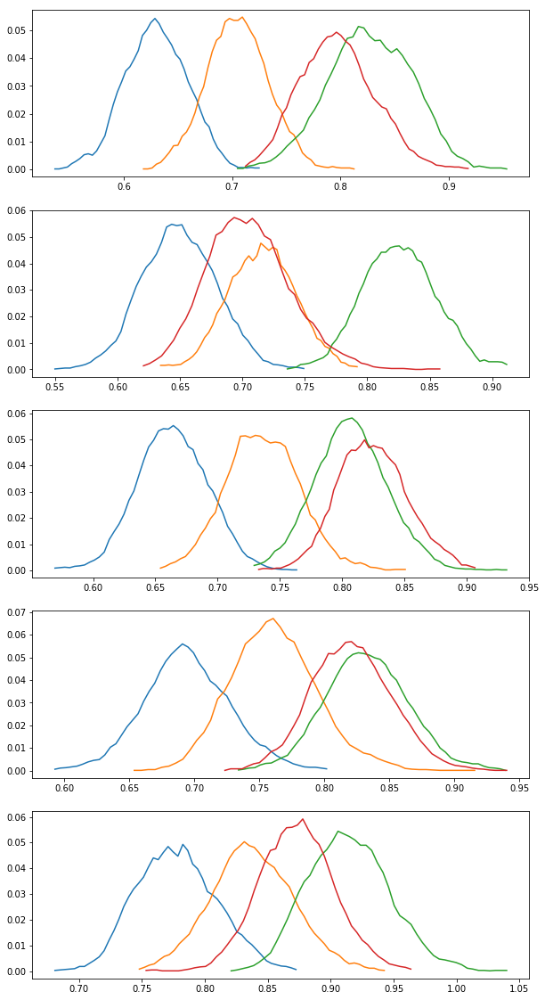

In [22]:
plt.figure(figsize=(10,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    for j in range(len(stages)):
        c, x = np.histogram(bs_stats[:,i,j,2], 50)
        c    = c/c.sum()
        plt.plot(x[1:], smooth(c,5), label = stages[j])

100%|██████████| 5/5 [00:15<00:00,  3.12s/it]


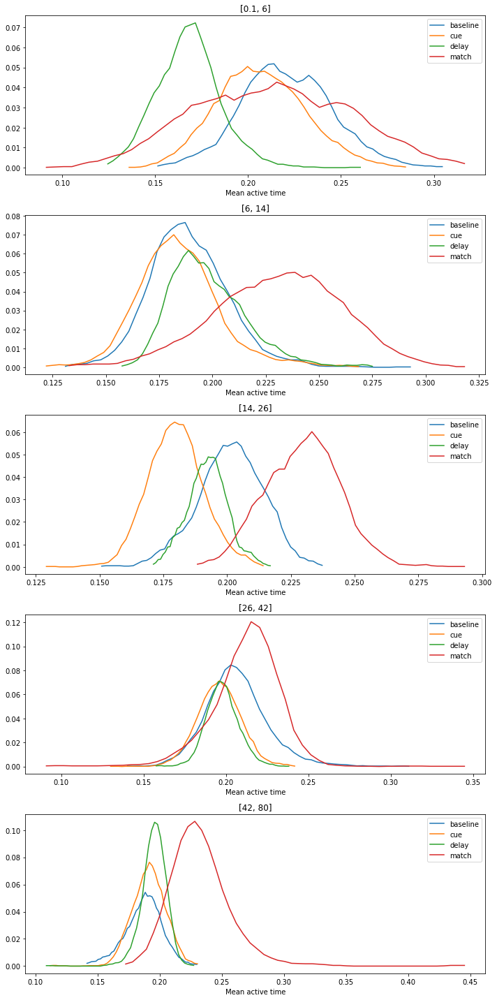

In [20]:
plt.figure(figsize=(10,20))
for i in tqdm( range(len(net.bands)) ):
    b  = {}
    plt.subplot(5,1,i+1)
    for j,s in zip(range(len(stages)),stages):
        b[stages[j]]  = np.zeros([net.super_tensor.shape[0], 4])
        b[stages[j]]  = np.apply_along_axis(bst.compute_burstness_stats, 1, STb[:,i,:]*net.s_mask[s], 
                                            samples = np.sum(net.s_mask[s]), 
                                            dt=15/1000)
        aux = b[stages[j]][:,2]
        c, x = np.histogram(aux, 50)
        c    = c/c.sum()
        plt.plot(x[1:], smooth(c,5), label = stages[j])
    plt.legend()
    plt.xlabel('Mean active time')
    plt.title(bands[i])
plt.tight_layout()

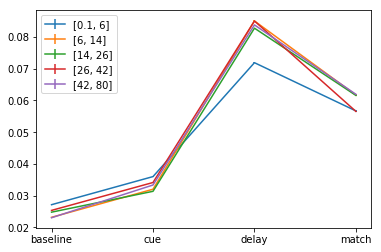

In [21]:
for j in range(len(bands)):
    for i,s in zip(range(len(stages)),stages):
        b[stages[i]]  = np.zeros([STb.shape[0], 3])
        b[stages[i]]  = np.apply_along_axis( bst.compute_burstness_stats, 1, STb[:,j,:]*net.s_mask[s])

    p=b['baseline'][:,1]
    c=b['cue'][:,1]
    d=b['delay'][:,1]
    m=b['match'][:,1]

    plt.errorbar(range(4), [p.mean(), c.mean(), d.mean(), m.mean()], 
                 [p.std()/np.sqrt(1176), c.std()/np.sqrt(1176), d.std()/np.sqrt(1176), m.std()/np.sqrt(1176)])
    plt.xticks(range(4), ['baseline', 'cue', 'delay', 'match'])
plt.legend(bands)

In [23]:
CVm = np.zeros([49, 49, len(bands), len(stages)]) 
for k in tqdm( range(len(bands)) ):
    for i in range(len(stages)):
        aux  = np.apply_along_axis( bst.compute_burstness_stats, 1, STb[:,k,:]*net.s_mask[stages[i]])
        for j in range( net.session_info['pairs'].shape[0]):
            CVm[net.session_info['pairs'][j,0], net.session_info['pairs'][j,1], k, i] = aux[j,2]

100%|██████████| 5/5 [00:11<00:00,  2.40s/it]


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


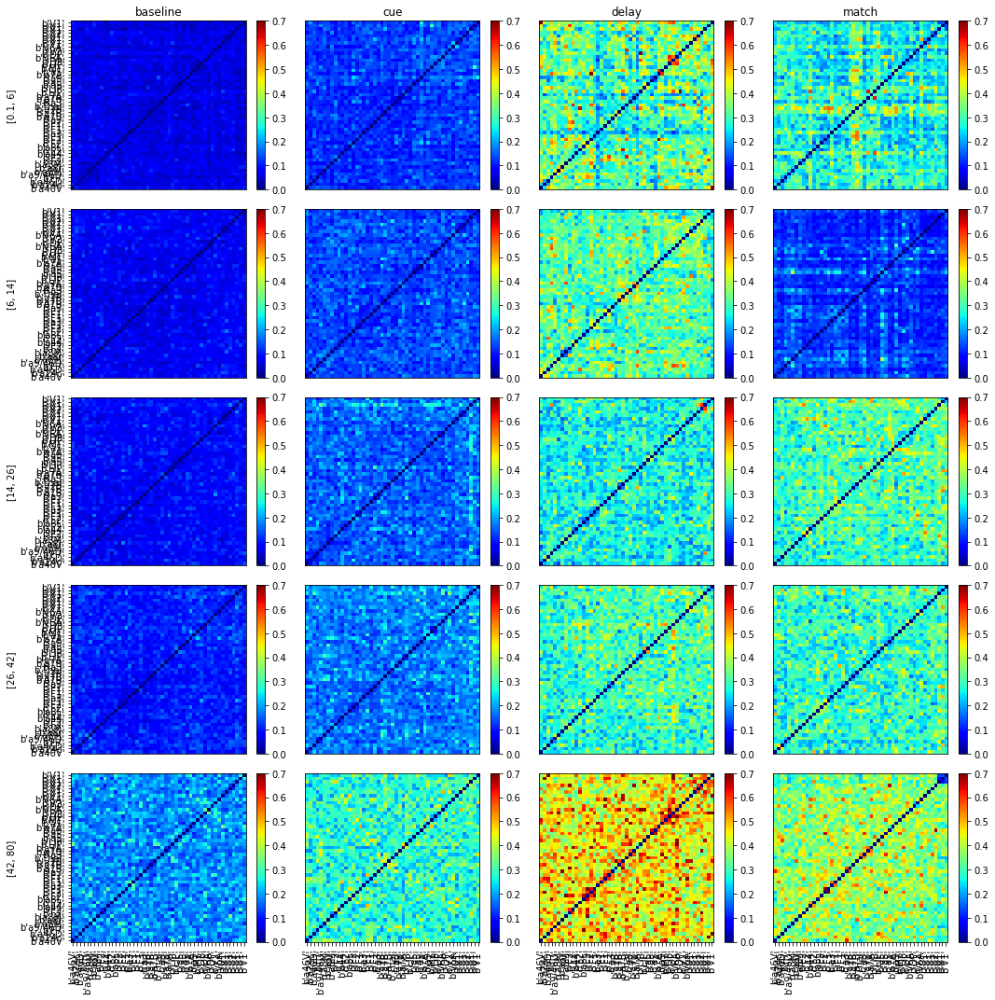

In [24]:
plt.figure(figsize=(15,15))
count = 1
for k in tqdm( range(len(bands)) ):
    for i in range(len(stages)):
        plt.subplot(len(bands),len(stages),count)
        aux = (CVm[:,:,k,i]+CVm[:,:,k,i].T) 
        plt.imshow(aux**6, aspect='auto', cmap='jet', origin='lower', vmin=0, vmax=.7);plt.colorbar()
        if stages[i] == 'baseline': plt.yticks(range(49), net.session_info['areas'])
        else: plt.yticks([])
        if k == 4: plt.xticks(range(49), net.session_info['areas'], rotation=90)
        else: plt.xticks([])
        if k == 0: plt.title(stages[i])
        if stages[i] == 'baseline': plt.ylabel(bands[k])
        #plt.colorbar()
        count+=1
plt.tight_layout()

In [32]:
aux = STb[:,k,:]*net.s_mask[stages[0]]+STb[:,k,:]*net.s_mask[stages[1]]+STb[:,k,:]*net.s_mask[stages[2]]+STb[:,k,:]*net.s_mask[stages[3]]

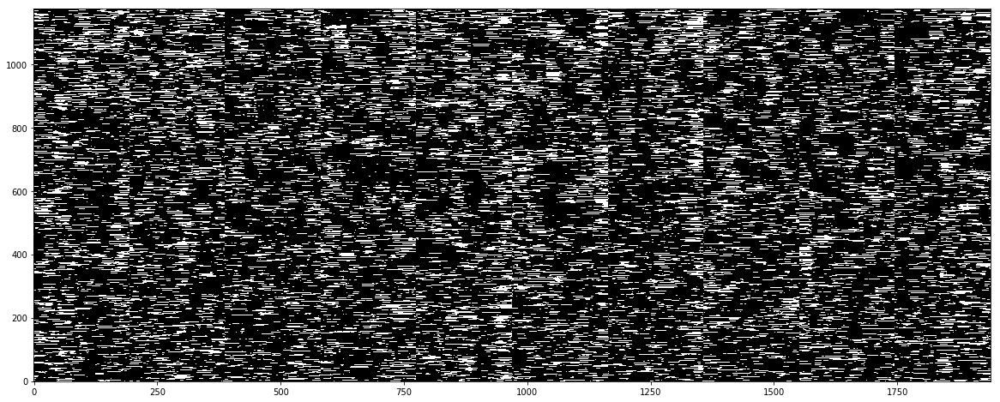

In [35]:
plt.figure(figsize=(20,8))
plt.imshow(aux[:,:10*194], aspect='auto', cmap='gray', origin='lower')

####  Varying q

In [23]:
q_list = np.arange(0.2, 1.0, 0.1)
cv     = np.zeros([len(bands), len(stages), len(q_list)])

for i in tqdm( range(len(q_list)) ):
    # Instantiating a temporal network object without thresholding the data
    net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = 'data/', monkey='lucy', 
                            session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                            relative=True, q=q_list[i])
    
    # Getting the number for ODRT trials
    filtered_trials     = net.trial_info[(net.trial_info['trial_type']==1.0)\
                                   & (net.trial_info['behavioral_response']==1.0)].trial_index.values
    # Getting the index for those trials
    filtered_trials_idx = net.trial_info[(net.trial_info['trial_type']==1.0)\
                                   & (net.trial_info['behavioral_response']==1.0)].index.values
    # Filter supertensor for the desired trials
    filtered_super_tensor = net.super_tensor.sel(trials = filtered_trials)
    #
    STb = filtered_super_tensor.stack(observations=("trials","time"))
    
    for k in range(len(net.bands)):
        b  = {}
        for j,s in zip(range(len(stages)),stages):
            cv[k,j,i]  = np.apply_along_axis(count_activations, 1, STb[:,k,s_mask[s]])[:,2].mean()

  0%|          | 0/8 [00:00<?, ?it/s]

Computing coherence thresholds



 12%|█▎        | 1/8 [01:19<09:17, 79.60s/it]

Computing coherence thresholds



 25%|██▌       | 2/8 [02:33<07:47, 77.90s/it]

Computing coherence thresholds



 38%|███▊      | 3/8 [03:47<06:22, 76.57s/it]

Computing coherence thresholds



 50%|█████     | 4/8 [05:00<05:02, 75.59s/it]

Computing coherence thresholds



 62%|██████▎   | 5/8 [06:13<03:44, 74.93s/it]

Computing coherence thresholds



 75%|███████▌  | 6/8 [07:27<02:28, 74.45s/it]

Computing coherence thresholds



 88%|████████▊ | 7/8 [08:40<01:14, 74.05s/it]

Computing coherence thresholds



100%|██████████| 8/8 [09:54<00:00, 74.31s/it]


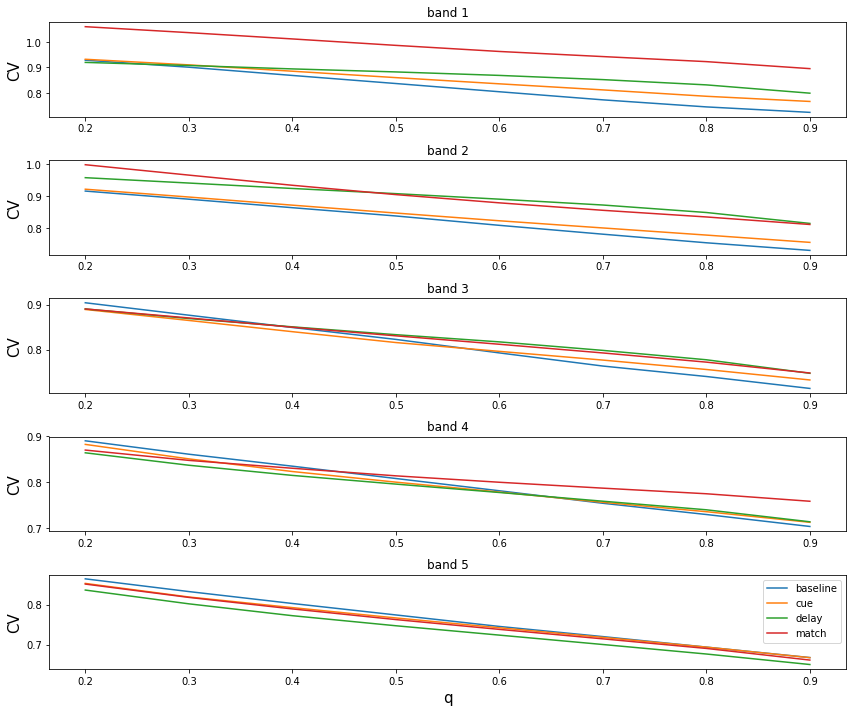

In [24]:
plt.figure(figsize=(12,10))
for i in range(len(bands)):
    plt.subplot(5,1,i+1)
    for s in range(len(stages)):
        plt.plot(q_list, cv[i,s,:], label=stages[s])
        plt.ylabel('CV', fontsize=15)
        plt.title('band ' + str(i+1))
plt.xlabel('q', fontsize=15)
plt.legend()
plt.tight_layout()

#### Top 20 most active links

100%|██████████| 5/5 [00:53<00:00, 10.79s/it]


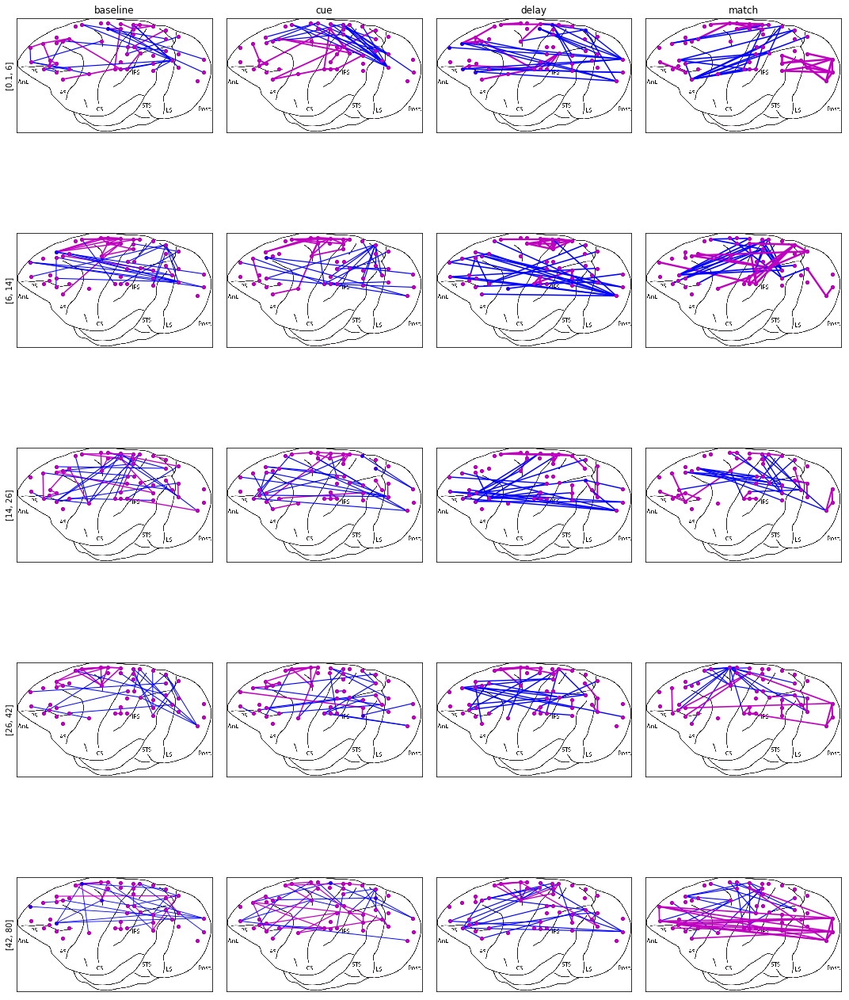

In [26]:
plt.figure(figsize=(15,20))
count = 1
for j in tqdm( range(len(bands)) ):
    b  = {}
    for i in range(len(stages)):     
        # Computing links' CV
        b[stages[i]]  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask[stages[i]]])
        # Plotting top links
        plt.subplot(len(bands), len(stages), count)
        # Top 20 links
        top  = b[stages[i]][:,0].argsort()[:20]
        idx1 = np.zeros(b[stages[i]][:,0].shape[0])
        idx1[top] = 1
        # Bottom 20 links
        bot  = b[stages[i]][:,0].argsort()[-20:]
        idx2 = np.zeros(b[stages[i]][:,0].shape[0])
        idx2[bot] = 1
        #
        aux = b[stages[i]][:,0]*idx1 - b[stages[i]][:,0]*idx2
        plot_edge_brain_sketch(net.session_info['pairs'], net.session_info['channels_labels'].astype(int), 
                               .1*aux)
        if j == 0: plt.title(stages[i])
        if stages[i] == 'baseline': plt.ylabel(bands[j])
        count += 1
plt.tight_layout()

#### Top 20 most busrty links

100%|██████████| 5/5 [00:56<00:00, 11.34s/it]


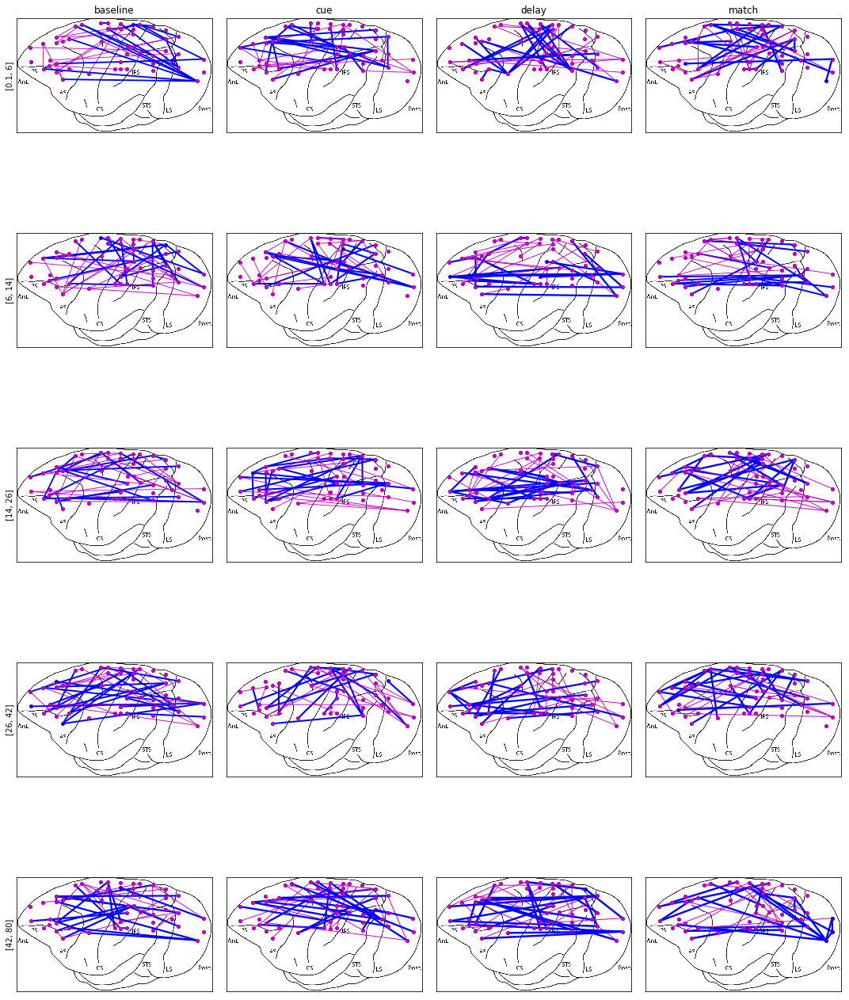

In [27]:
plt.figure(figsize=(15,20))
count = 1
for j in tqdm( range(len(bands)) ):
    b  = {}
    for i in range(len(stages)):     
        # Computing links' CV
        b[stages[i]]  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask[stages[i]]])
        # Plotting top links
        plt.subplot(len(bands), len(stages), count)
        # Top 20 links
        top  = b[stages[i]][:,2].argsort()[:20]
        idx1 = np.zeros(b[stages[i]][:,2].shape[0])
        idx1[top] = 1
        # Bottom 20 links
        bot  = b[stages[i]][:,2].argsort()[-20:]
        idx2 = np.zeros(b[stages[i]][:,2].shape[0])
        idx2[bot] = 1
        #
        aux = 3*b[stages[i]][:,2]*idx1 - b[stages[i]][:,2]*idx2
        plot_edge_brain_sketch(net.session_info['pairs'], net.session_info['channels_labels'].astype(int), 
                               aux)
        if j == 0: plt.title(stages[i])
        if stages[i] == 'baseline': plt.ylabel(bands[j])
        count += 1
plt.tight_layout()

#### Burstness vs active time

100%|██████████| 5/5 [00:09<00:00,  1.90s/it]


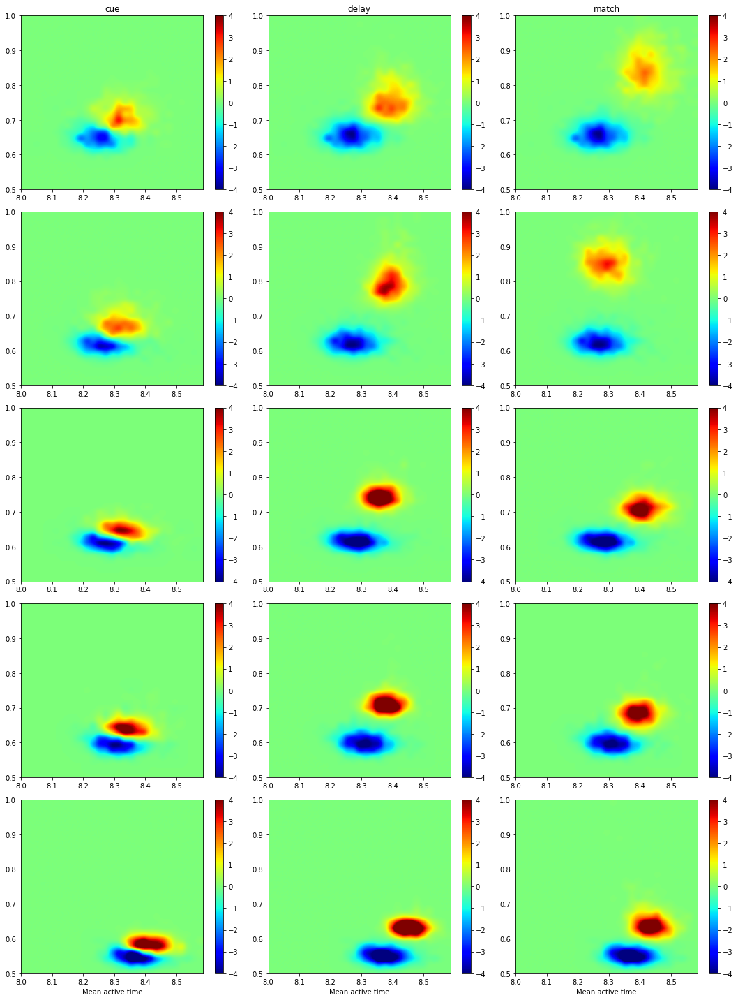

In [29]:
plt.figure(figsize=(15,20))
count = 1
for j in tqdm( range(len(bands)) ):
    b  = {}
    # Baseline
    b['baseline']  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask['baseline']])
    Hb, xb, yb = np.histogram2d(b['baseline'][:,0], b['baseline'][:,2], 
                            bins=[np.linspace(8,25,30), np.linspace(0.5,1,30)], density = True  )
    for i in range(1,len(stages)):     
        # Computing links' CV
        b[stages[i]]  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask[stages[i]]])
        # Plotting top links
        plt.subplot(len(bands), len(stages)-1, count)
        #plt.hist2d(b[stages[i]][:,0], b[stages[i]][:,2], bins=[np.linspace(8,25,30), np.linspace(0.5,1,30)] )
        H, xb, yb = np.histogram2d(b[stages[i]][:,0], b[stages[i]][:,2], 
                               bins=[np.linspace(8,25,30), np.linspace(0.5,1,30)], density = True )
        plt.imshow(H-Hb, aspect='auto', cmap='jet', origin='lower', 
                   extent=[xb[0],xb[1],yb[0],yb[-1]], interpolation='gaussian', vmin=-4, vmax=4)
        plt.colorbar()
        if j == 4: plt.xlabel('Mean active time')
        if j == 0: plt.title(stages[i])
        #if stages[i] == 'cue': plt.ylabel('Link CV, ' + bands[j])
        count += 1
plt.tight_layout()

#### Dimensinality reduction on the raster plots

In [30]:
from MulticoreTSNE    import MulticoreTSNE as TSNE
from sklearn.manifold import TSNE

In [31]:
Y = TSNE(n_components=2, metric='hamming', perplexity=30.0, n_jobs=40).fit_transform(STb[:,1,:100*194].T)

/home/vinicius/.local/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


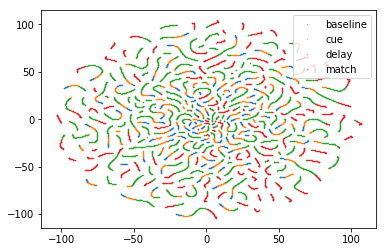

In [32]:
for i in range(len(stages)):
    plt.plot(Y[s_mask[stages[i]][:100*194],0], Y[s_mask[stages[i]][:100*194],1], '.', ms=0.5, label = stages[i])
plt.legend()

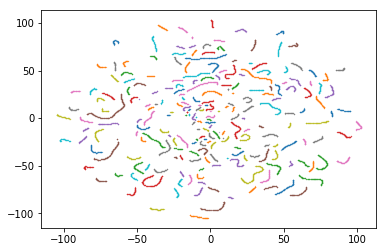

In [26]:
# To check if each worm is a trial (each color is a different trial)
for i in range(50):
    plt.plot(Y[i*194:(i+1)*194,0], Y[i*194:(i+1)*194,1], '.', ms=0.5,)

#### Burstiness vs electrode distance

100%|██████████| 5/5 [00:09<00:00,  1.81s/it]


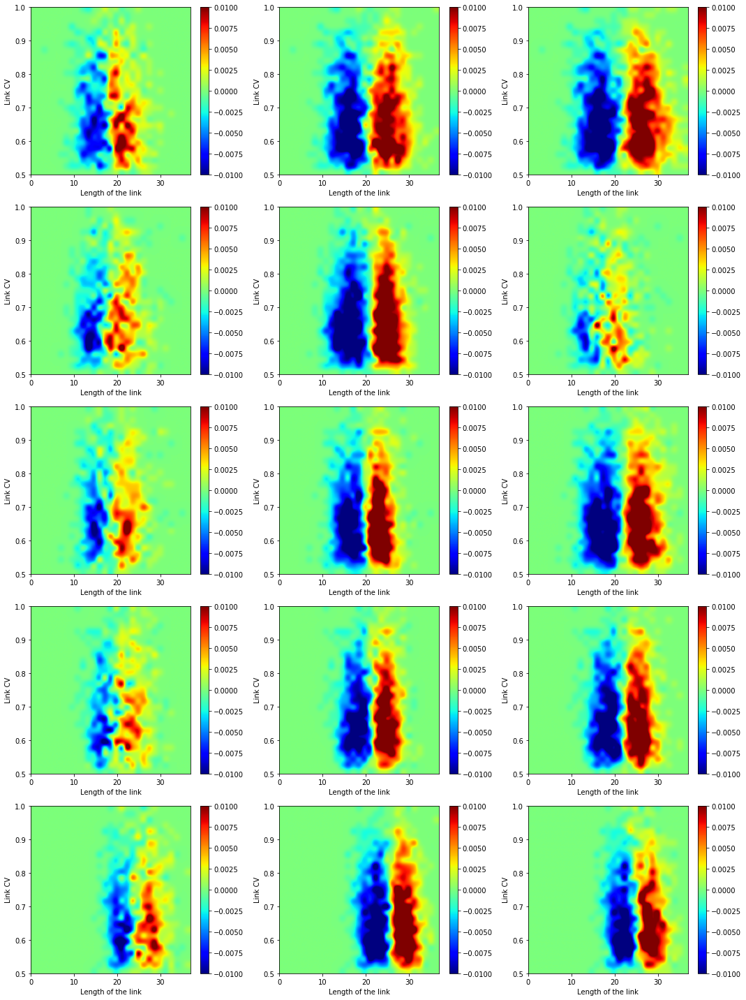

In [33]:
plt.figure(figsize=(15,20))
count = 1
for j in tqdm( range(len(bands)) ):
    b  = {}
    # Baseline
    b['baseline']  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask['baseline']])
    Hb,xb,yb=np.histogram2d(d_eu, b['baseline'][:,2], 
                            bins=[np.linspace(0,d_eu.max(),30), np.linspace(0.5,1,30)],
                            density=True)
    for i in range(1, len(stages)):     
        # Computing links' CV
        b[stages[i]]  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask[stages[i]]])
        # Plotting
        plt.subplot(len(bands), len(stages)-1, count)
        H,xb,yb=np.histogram2d(d_eu, b[stages[i]][:,2], 
                               bins=[np.linspace(0,d_eu.max(),30), np.linspace(0.5,1,30)],
                               density=True)
        plt.imshow(H-Hb, aspect='auto', cmap='jet', origin='lower', 
                   extent=[xb[0],xb[1],yb[0],yb[-1]], interpolation='gaussian', vmin=-0.01, vmax=0.01)
        plt.ylabel('Link CV')
        plt.colorbar()
        plt.xlabel('Length of the link')
        count+=1
plt.tight_layout()

#### Links' correlation

In [34]:
nP       = int( scipy.special.comb(net.session_info['nP'], 2) )
i, j     = np.tril_indices(net.session_info['nP'], k = -1)
pairs    = np.array([j,i]).T

In [35]:
CCij = np.zeros([len(net.bands), net.session_info['nP'],net.session_info['nP'],len(stages)])
for b in tqdm( range(len(net.bands)) ):
    for s in range(len(stages)):
        CCij[b,:,:,s] = np.corrcoef(STb[:,b,s_mask[stages[s]]].values, rowvar=True) #CCij[b,j,i,s] = np.corrcoef(aux[i],aux[j])[0,1]# / L

100%|██████████| 5/5 [00:29<00:00,  5.81s/it]


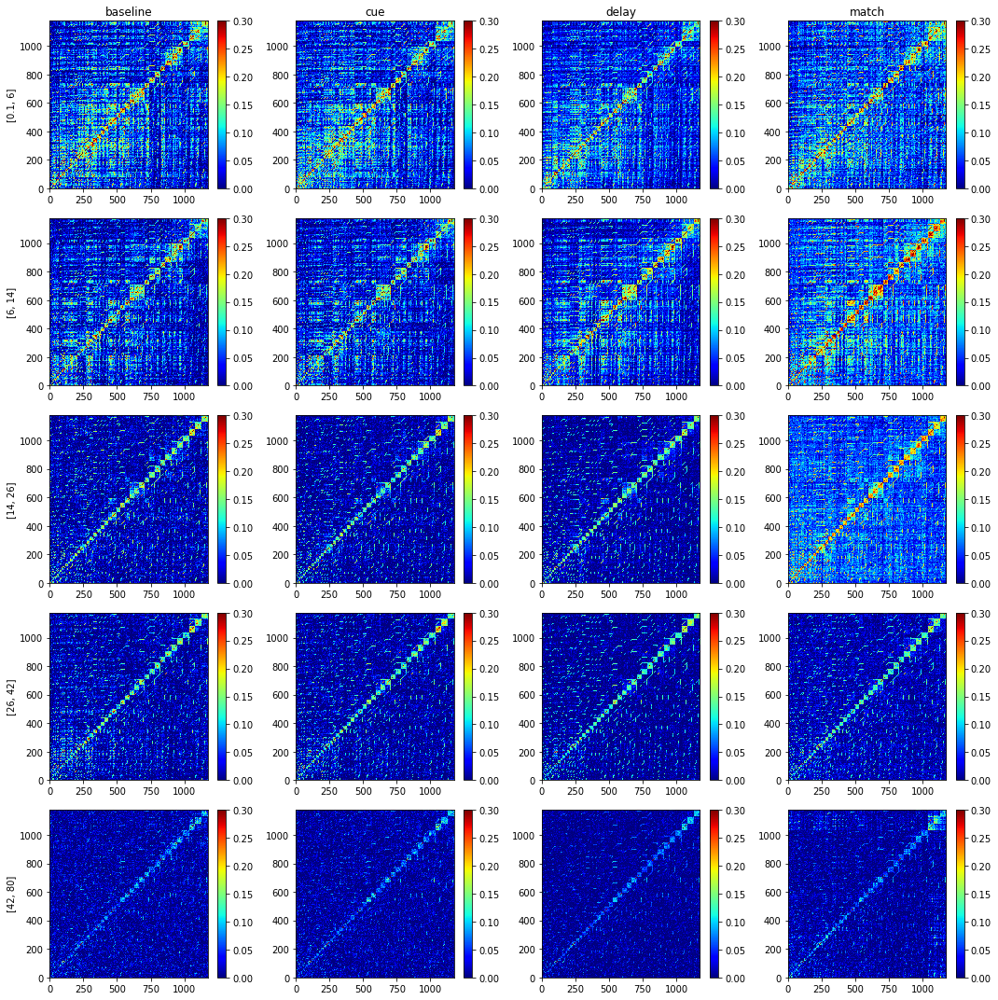

In [36]:
plt.figure(figsize=(15,15))
count = 1
for b in range(len(net.bands)):
    for i in range(len(stages)):
        plt.subplot(len(net.bands),len(stages),count)
        plt.imshow(CCij[b,:,:,i], aspect='auto', cmap='jet', origin='lower', 
                   vmin=0, vmax=.3)
        if b == 0: plt.title(stages[i])
        if i == 0: plt.ylabel(bands[b])
        plt.colorbar()
        count+=1
plt.tight_layout()

### Cross-frequency coupling

### Comparison with fixation

In [51]:
# Getting the number for ODRT trials
filtered_trials_fix     = net.trial_info[(net.trial_info['trial_type']==2.0)].trial_index.values
# Getting the index for those trials
filtered_trials_idx_fix = net.trial_info[(net.trial_info['trial_type']==2.0)].index.values

In [52]:
# Filter supertensor for the desired trials
filtered_super_tensor_fix = net.super_tensor.sel(trials = filtered_trials_fix)
# Filter adj for the desired trials
filtered_adjacency_fix = net.A.sel(trials = filtered_trials_fix)

In [53]:
# Mask to track each stage of the ODRT
s_mask_fix = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx_fix],
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx_fix],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx_fix], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_idx_fix), flatten=True)

In [54]:
# Stack trials and time in the super tensor
STb_fix = filtered_super_tensor_fix.stack(observations=("trials","time"))
STb_fix

<xarray.DataArray (links: 1176, bands: 5, observations: 14744)>
array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       ...,

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ...,  True,  True,  True],
        [ True,  True,  True, ..., False, False, False],
        [ True, False, False, ...,  True,  True,  True]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ...,  True,  True,  True],
        [ True,  True,  True, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ...,  True,  True,  True],
        [ True,  True, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])
Coordinates:
  * observations  (observations) MultiIndex
  - trials        (observations) int64 0 0 0 0 0 0 0 ... 882 882 882 882 882 882
  - time          (observations) float64 -0.35 -0.335 -0.32 ... 2.515 2.53 2.545
Dimensions without coordinates: links, bands
Attributes:
    nT:               750
    areas:            [b'a46V' b'a24c' b'a46D' b'F7' b'a9/46D' b'a8M' b'a8r' ...
    channels_labels:  [  1   4   9  13  16  17  22  23  26  27  29  34  39  4...
    fsample:          1000.0
    indch:            [ 0  1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 17 18 ...
    nC:               49
    nP:               1176
    pairs:            [[ 0  1]\n [ 0  2]\n [ 1  2]\n ...\n [45 48]\n [46 48]\...
    stim:             [nan  2.  5.  2.  4.  2.  4.  2.  5.  1.  3.  5.  5.  1...
    t_cue_off:        [1495. 1371. 1600. 1528. 1480. 1489. 1473. 1341. 1553. ...
    t_cue_on:         [ 975.  851. 1093. 1021.  973.  969.  966.  835. 1046. ...
    t_match_on:       [2654. 2824. 2946. 2954. 2759. 2676. 2699. 2474. 2846. ...

100%|██████████| 5/5 [00:11<00:00,  2.34s/it]


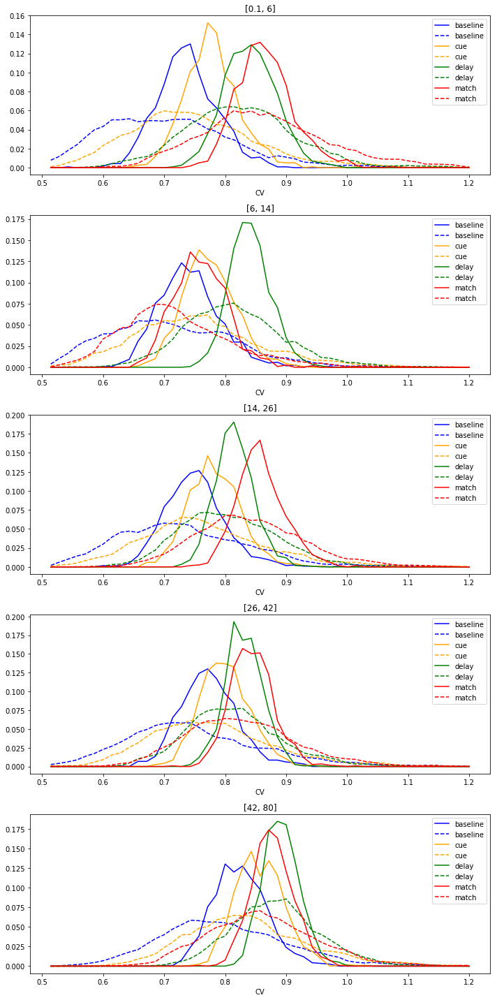

In [55]:
plt.figure(figsize=(10,20))
colors = ['b', 'orange', 'g', 'r']
for i in tqdm( range(len(net.bands)) ):
    b     = {}
    b_fx  = {}
    plt.subplot(5,1,i+1)
    for j in range(len(stages)):
        # ODRT
        b[stages[j]]  = np.zeros([STb.shape[0], 3])
        b[stages[j]]  = np.apply_along_axis(count_activations, 1, STb[:,i,s_mask[stages[j]]])
        aux  = b[stages[j]][:,1]/b[stages[j]][:,0]
        c, x = np.histogram(aux, np.linspace(0.5,1.2,50))
        c    = c/c.sum()
        plt.plot(x[1:], c, label = stages[j], linestyle = '-', color = colors[j])        
        # FIXATION
        b_fx[stages[j]]  = np.zeros([STb_fix.shape[0], 3])
        b_fx[stages[j]]  = np.apply_along_axis(count_activations, 1, STb_fix[:,i,s_mask_fix[stages[j]]])
        aux = b_fx[stages[j]][:,1]/b_fx[stages[j]][:,0]
        c_fx, x_fx = np.histogram(aux, np.linspace(0.5,1.2,50))
        c_fx    = c_fx/c_fx.sum()
        plt.plot(x_fx[1:], smooth(c_fx,3), label = stages[j], linestyle = '--', color = colors[j])
    plt.legend()
    plt.xlabel('CV')
    plt.title(bands[i])
plt.tight_layout()

In [56]:
Y = TSNE(n_components=2, metric='hamming', perplexity=30.0, n_jobs=40).fit_transform(STb_fix[:,1,:100*194].T)

/home/vinicius/.local/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


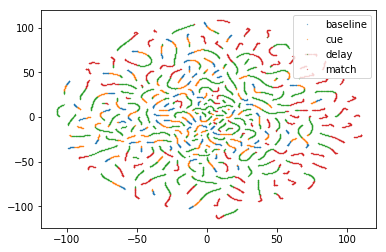

In [57]:
for i in range(len(stages)):
    plt.plot(Y[s_mask_fix[stages[i]][:100*194],0], Y[s_mask_fix[stages[i]][:100*194],1], '.', ms =0.5, label = stages[i])
plt.legend()

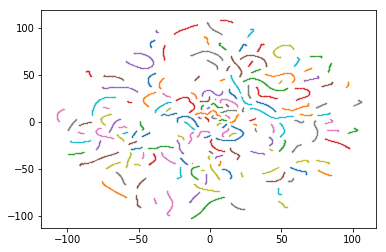

In [58]:
# To check if each worm is a trial (each color is a different trial)
for i in range(50):
    plt.plot(Y[i*194:(i+1)*194,0], Y[i*194:(i+1)*194,1], '.', ms=0.5)

#### Burstness vs active time

100%|██████████| 5/5 [00:14<00:00,  2.95s/it]


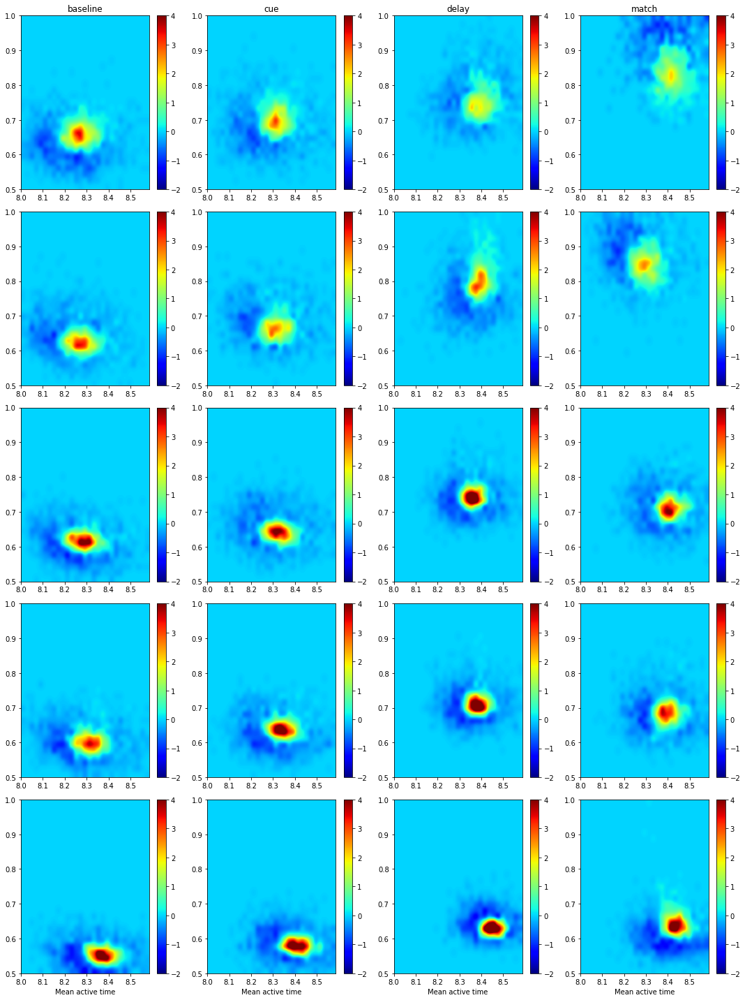

In [60]:
plt.figure(figsize=(15,20))
count = 1
for j in tqdm( range(len(bands)) ):
    b    = {}
    b_fx = {}
    for i in range(len(stages)):   
        plt.subplot(len(bands), len(stages), count)
        # ODRT
        b[stages[i]]  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask[stages[i]]])
        H, xb, yb = np.histogram2d(b[stages[i]][:,0], b[stages[i]][:,2], 
                               bins=[np.linspace(8,25,30), np.linspace(0.5,1,30)], density = True )
        # FIXATION
        b_fx[stages[i]]  = np.apply_along_axis( count_activations, 1, STb_fix[:,j,s_mask_fix[stages[i]]])
        H_fx, xb_fx, yb_fx = np.histogram2d(b_fx[stages[i]][:,0], b_fx[stages[i]][:,2], 
                               bins=[np.linspace(8,25,30), np.linspace(0.5,1,30)], density = True )
        # PLOT
        plt.imshow(H-H_fx, aspect='auto', cmap='jet', origin='lower', 
                   extent=[xb[0],xb[1],yb[0],yb[-1]], interpolation='gaussian', vmin=-2, vmax=4)
        plt.colorbar()
        if j == 4: plt.xlabel('Mean active time')
        if j == 0: plt.title(stages[i])
        #if stages[i] == 'baseline': plt.ylabel('Link CV, ' + bands[j])
        count += 1
plt.tight_layout()

#### Burstiness vs electrode distance

100%|██████████| 5/5 [00:12<00:00,  2.43s/it]


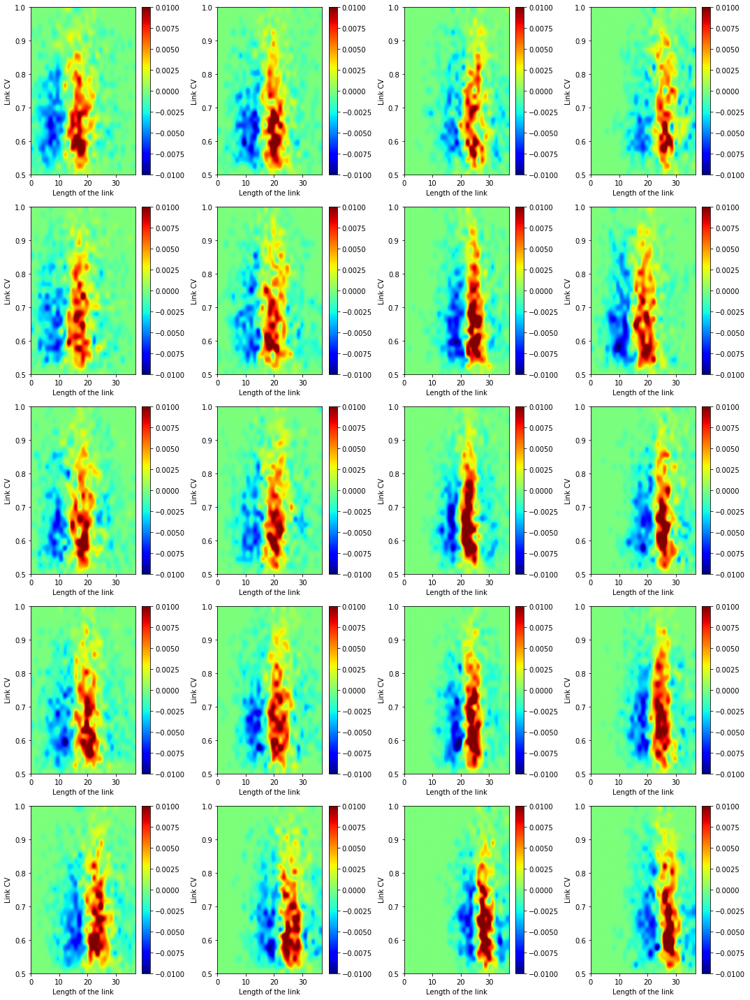

In [61]:
plt.figure(figsize=(15,20))
count = 1
for j in tqdm( range(len(bands)) ):
    b  = {}
    for i in range(len(stages)):     
        plt.subplot(len(bands), len(stages), count)
        # ODRT
        b[stages[i]]  = np.apply_along_axis( count_activations, 1, STb[:,j,s_mask[stages[i]]])
        H,xb,yb = np.histogram2d(d_eu, b[stages[i]][:,2], 
                               bins=[np.linspace(0,d_eu.max(),30), np.linspace(0.5,1,30)],
                               density=True)
        # FIXATION
        b_fx[stages[i]]  = np.apply_along_axis( count_activations, 1, STb_fix[:,j,s_mask_fix[stages[i]]])
        H_fx,xb_fx,yb_fx = np.histogram2d(d_eu, b_fx[stages[i]][:,2], 
                               bins=[np.linspace(0,d_eu.max(),30), np.linspace(0.5,1,30)],
                               density=True)
        # PLOTING
        plt.imshow(H-H_fx, aspect='auto', cmap='jet', origin='lower', 
                   extent=[xb[0],xb[1],yb[0],yb[-1]], interpolation='gaussian', vmin=-0.01, vmax=0.01)
        plt.ylabel('Link CV')
        plt.colorbar()
        plt.xlabel('Length of the link')
        count+=1
plt.tight_layout()

#### Links' correlation

In [62]:
CCij_fx = np.zeros([len(net.bands), net.session_info['nP'],net.session_info['nP'],len(stages)])
for b in tqdm( range(len(net.bands)) ):
    for s in range(len(stages)):
        CCij_fx[b,:,:,s] = np.corrcoef(STb_fix[:,b,s_mask_fix[stages[s]]].values, rowvar=True) 

100%|██████████| 5/5 [00:04<00:00,  1.15it/s]


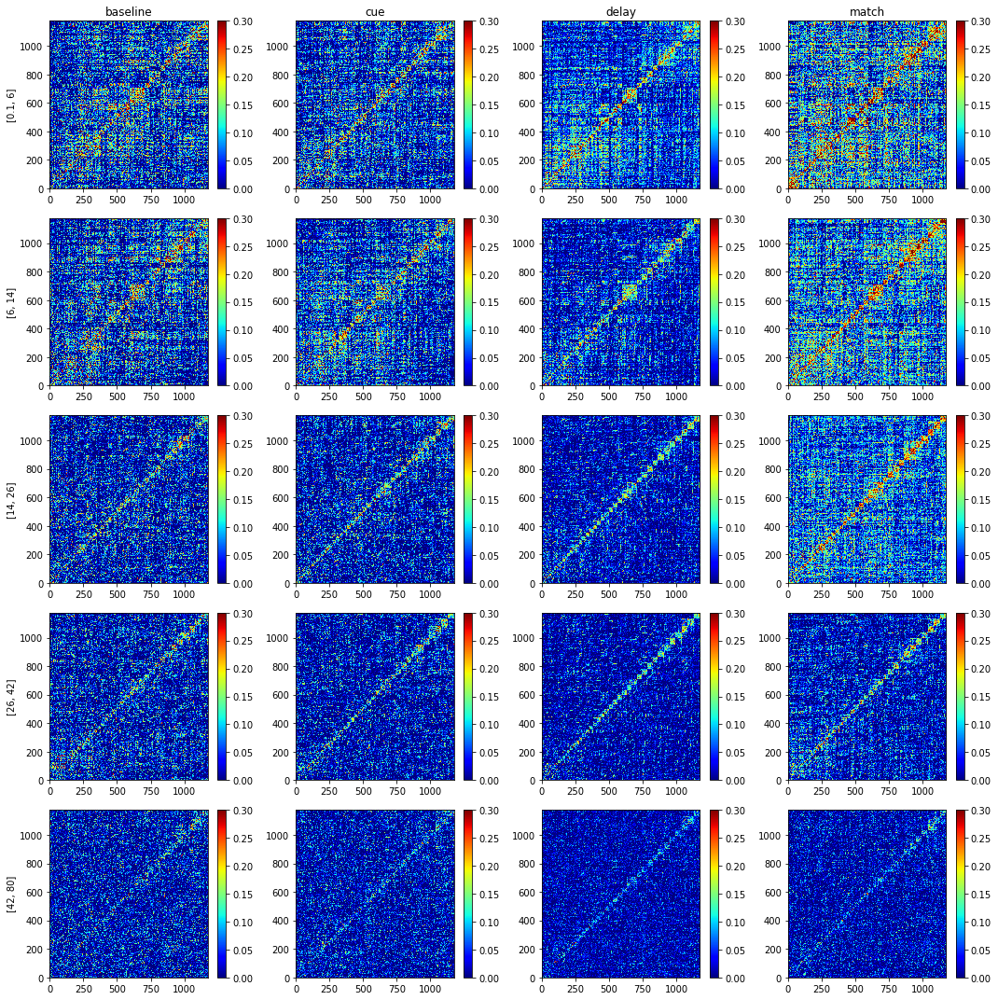

In [63]:
plt.figure(figsize=(15,15))
count = 1
for b in range(len(net.bands)):
    for i in range(len(stages)):
        plt.subplot(len(net.bands),len(stages),count)
        plt.imshow(CCij_fx[b,:,:,i], aspect='auto', cmap='jet', 
                   origin='lower', vmin=0,vmax=0.3)
        if b == 0: plt.title(stages[i])
        if i == 0: plt.ylabel(bands[b])
        plt.colorbar()
        count+=1
plt.tight_layout()

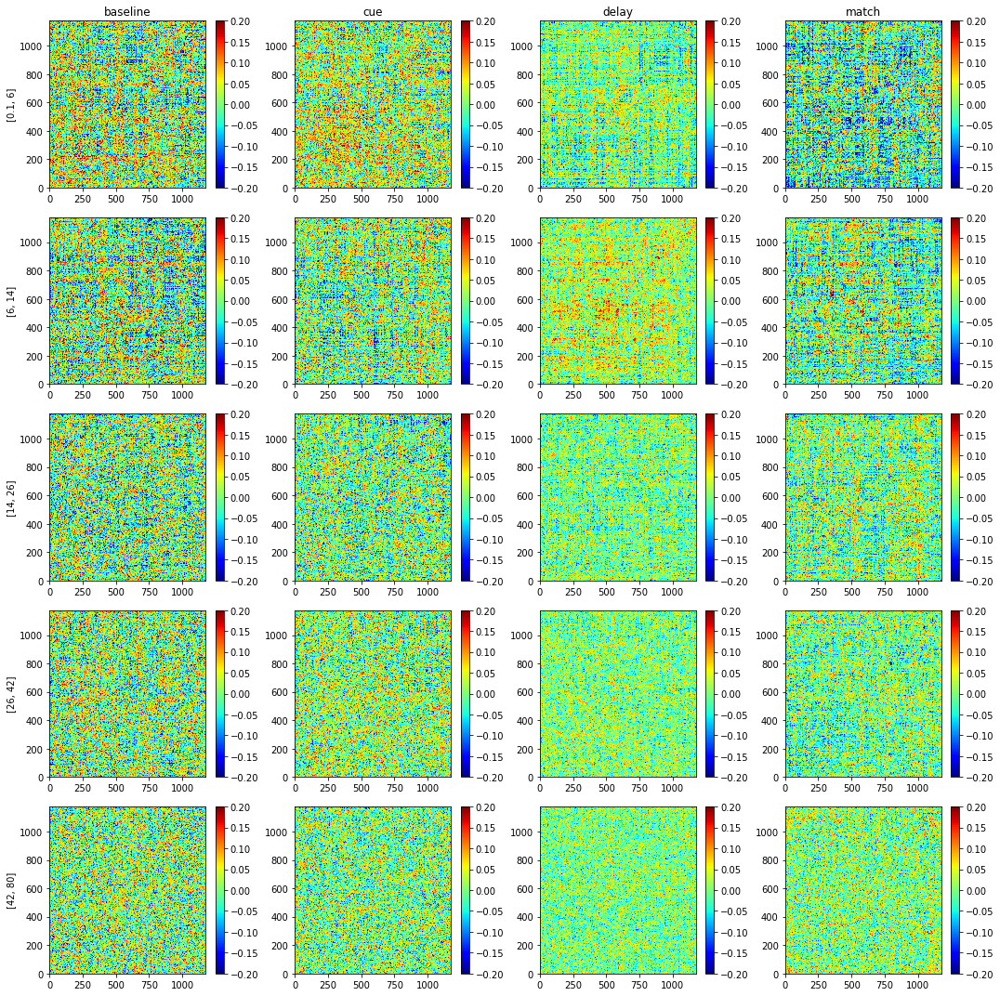

In [64]:
plt.figure(figsize=(15,15))
count = 1
for b in range(len(net.bands)):
    for i in range(len(stages)):
        plt.subplot(len(net.bands),len(stages),count)
        plt.imshow((CCij[b,:,:,i]-CCij_fx[b,:,:,i]), aspect='auto', cmap='jet', origin='lower',vmin=-0.2,vmax=0.2)
        if b == 0: plt.title(stages[i])
        if i == 0: plt.ylabel(bands[b])
        plt.colorbar()
        count+=1
plt.tight_layout()

In [85]:
np.nanmean([])

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.


nan

In [86]:
a=[]

In [87]:
a==[]

True

In [88]:
np.std(a)

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib64/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib64/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib64/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


nan

In [89]:
np.sum(a)

0.0

In [90]:
len(a)

0

In [33]:
a=net.super_tensor.isel(links=0,bands=0,trials=0).isel(time=s_mask['cue'][0])

In [34]:
a

<xarray.DataArray (time: 34)>
array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True])
Coordinates:
    trials   int64 0
  * time     (time) float64 0.01 0.025 0.04 0.055 0.07 ... 0.46 0.475 0.49 0.505
Attributes:
    nT:               750
    areas:            [b'a46V' b'a24c' b'a46D' b'F7' b'a9/46D' b'a8M' b'a8r' ...
    channels_labels:  [  1   4   9  13  16  17  22  23  26  27  29  34  39  4...
    fsample:          1000.0
    indch:            [ 0  1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 17 18 ...
    nC:               49
    nP:               1176
    pairs:            [[ 0  1]\n [ 0  2]\n [ 1  2]\n ...\n [45 48]\n [46 48]\...
    stim:             [nan  2.  5.  2.  4.  2.  4.  2.  5.  1.  3.  5.  5.  1...
    t_cue_off:        [1495. 1371. 1600. 1528. 1480. 1489. 1473. 1341. 1553. ...
    t_cue_on:         [ 975.  851. 1093. 1021.  973.  969.  966.  835. 1046. ...
    t_match_on:       [2654. 2824. 2946. 2954. 2759. 2676. 2699. 2474. 2846. ...

In [32]:
s_mask['cue'].shape

(540, 194)

In [31]:
# Creating stages mask with trials concatenated
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_idx), flatten=False)

In [52]:
filtered_super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 540, time: 194)>
array([[[[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [ True,  True, False, ..., False,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False,  True,  True, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, 

In [53]:
[1010101]

[1010101]

In [56]:
7//2

3

nan

In [92]:
def find_activation_sequences(spike_train, dt=None, pad=False):
    r'''
    Given a spike-train, it finds the length of all activations in it.
    For example, for the following spike-train: x = {0111000011000011111},
    the array with the corresponding sequences of activations (ones) will be 
    returned: [3, 2, 5] (times dt if this parameter is provided).
    > INPUTS:
    - spike_train: The binary spike train.
    - dt: If providade the returned array with the length of activations will be given in seconds.
    > OUTPUTS:
    - act_lengths: Array containing the length of activations
    '''
    if dt is None:
        dt = 1
    # make sure all runs of ones are well-bounded
    bounded = np.hstack(([0], spike_train, [0]))
    # get 1 at run starts and -1 at run ends
    difs    = np.diff(bounded)
    run_starts, = np.where(difs > 0)
    run_ends,   = np.where(difs < 0)
    # Length of each activation sequence
    act_lengths =  (run_ends - run_starts)*dt
    # Padding
    max_size    = int( np.round(len(spike_train)/2) )
    if pad and len(act_lengths)<max_size:
        act_lengths = np.hstack( (act_lengths,np.ones(max_size-len(act_lengths))*np.nan) )
    return act_lengths

In [93]:
x = np.array([0,1,1,1,0,0,0,0,1,1,0,0,1,1,1,1,1])
#x = np.array([0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0])

In [94]:
find_activation_sequences(x, dt=1, pad=True)

array([ 3.,  2.,  5., nan, nan, nan, nan, nan])

In [95]:
np.round(len(x)/2)

8.0

In [90]:
filtered_super_tensor.isel(bands=0,trials=0)

<xarray.DataArray (links: 1176, time: 194)>
array([[ True,  True,  True, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
    trials   int64 1
  * time     (time) float64 -0.35 -0.335 -0.32 -0.305 ... 2.5 2.515 2.53 2.545
Dimensions without coordinates: links
Attributes:
    nT:               750
    areas:            [b'a46V' b'a24c' b'a46D' b'F7' b'a9/46D' b'a8M' b'a8r' ...
    channels_labels:  [  1   4   9  13  16  17  22  23  26  27  29  34  39  4...
    fsample:          1000.0
    indch:            [ 0  1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 17 18 ...
    nC:               49
    nP:               1176
    pairs:            [[ 0  1]\n [ 0  2]\n [ 1  2]\n ...\n [45 48]\n [46 48]\...
    stim:             [nan  2.  5.  2.  4.  2.  4.  2.  5.  1.  3.  5.  5.  1...
    t_cue_off:        [1495. 1371. 1600. 1528. 1480. 1489. 1473. 1341. 1553. ...
    t_cue_on:         [ 975.  851. 1093. 1021.  973.  969.  966.  835. 1046. ...
    t_match_on:       [2654. 2824. 2946. 2954. 2759. 2676. 2699. 2474. 2846. ...

In [30]:
aux = np.apply_along_axis(bst.find_activation_sequences, -1,
      filtered_super_tensor.isel(trials=0),
         dt=d_t, pad=True, max_size=105)

In [31]:
aux.shape

(1176, 5, 97)

In [61]:
mu = np.nanstd(aux, axis=-1)/np.nanmean(aux, axis=-1)

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib64/python3.6/site-packages/numpy/lib/nanfunctions.py:1628: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.


In [29]:
aux.reshape((1176,5,540*105))

(1176, 5, 540, 97)

In [63]:
mu = np.nanmean( mu, axis=-1)

In [24]:
np.ceil(0.5  * (1000) / 15).astype(int)

34